# Importing the required libraries.

In [162]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from matplotlib.pyplot import figure
k = plt.figure()
k.set_figwidth(10)
k.set_figheight(10)
import plotly.graph_objs as go

<Figure size 720x720 with 0 Axes>

In [163]:
df = pd.read_csv('adult1.csv')

# Shape of the Data.

In [164]:
df.shape

(32537, 15)

##### Our Data consists of 14 columns and 32.5k rows.

In [165]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32537 entries, 0 to 32536
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             32537 non-null  int64 
 1   Age group       32537 non-null  object
 2   Workclass       32537 non-null  object
 3   Education       32537 non-null  object
 4   Education.Num   32537 non-null  int64 
 5   Marital Status  32537 non-null  object
 6   Occupation      32537 non-null  object
 7   Relationship    32537 non-null  object
 8   Race            32537 non-null  object
 9   Sex             32537 non-null  object
 10  Capital.Gain    32537 non-null  int64 
 11  Capital.Loss    32537 non-null  int64 
 12  Hours.Per.Week  32537 non-null  int64 
 13  Native.Country  32537 non-null  object
 14  Income          32537 non-null  object
dtypes: int64(5), object(10)
memory usage: 3.7+ MB


In [166]:
df.columns

Index(['Age', 'Age group', 'Workclass', 'Education', 'Education.Num',
       'Marital Status', 'Occupation', 'Relationship', 'Race', 'Sex',
       'Capital.Gain', 'Capital.Loss', 'Hours.Per.Week', 'Native.Country',
       'Income'],
      dtype='object')

# Understanding the numerical variables.

In [167]:
df.describe(include='int64').T

,count,mean,std,min,25%,50%,75%,max
Age,32537.0,38.585549,13.637984,17.0,28.0,37.0,48.0,90.0
Education.Num,32537.0,10.081815,2.571633,1.0,9.0,10.0,12.0,16.0
Capital.Gain,32537.0,1078.443741,7387.957424,0.0,0.0,0.0,0.0,99999.0
Capital.Loss,32537.0,87.368227,403.101833,0.0,0.0,0.0,0.0,4356.0
Hours.Per.Week,32537.0,40.440329,12.346889,1.0,40.0,40.0,45.0,99.0


- ## 75% of the people work under 45 hours.
- ## Most of the people are under the age of 48.

- ### Education number doesn't provide much information, so we can discard this.

In [169]:
df.drop(['Education.Num'], axis=1, inplace=True)

# Overview of Data

In [170]:
df.head()

,Age,Age group,Workclass,Education,Marital Status,Occupation,Relationship,Race,Sex,Capital.Gain,Capital.Loss,Hours.Per.Week,Native.Country,Income
0,90,80+,Unknown,HS-grad,Widowed,Unknown,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,80+,Private,HS-grad,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,61-80,Unknown,Some-college,Widowed,Unknown,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,41-60,Private,7th-8th,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,41-60,Private,Some-college,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


## Oberving 'Age' variable's spread.

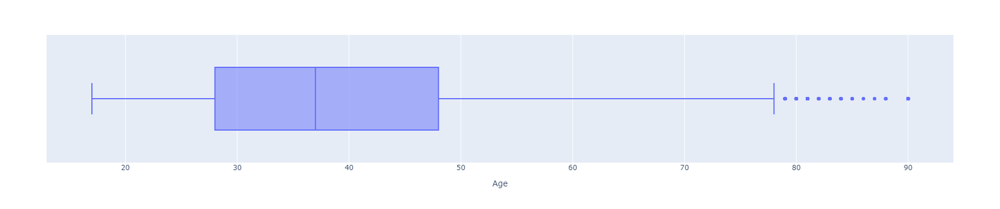

In [171]:
px.box(df, 'Age')

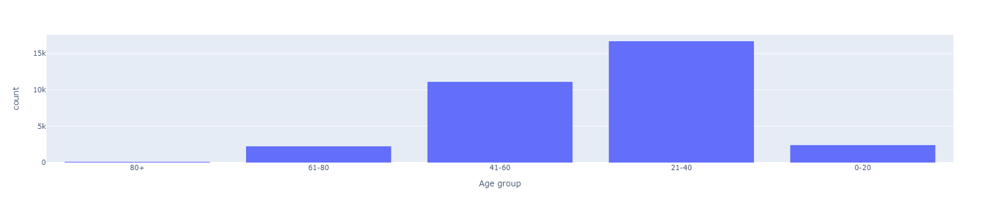

In [172]:
px.histogram(df, 'Age group')

- ## Age of people ranges from 17 to 90.
- ## 75% people are aged less than 37.

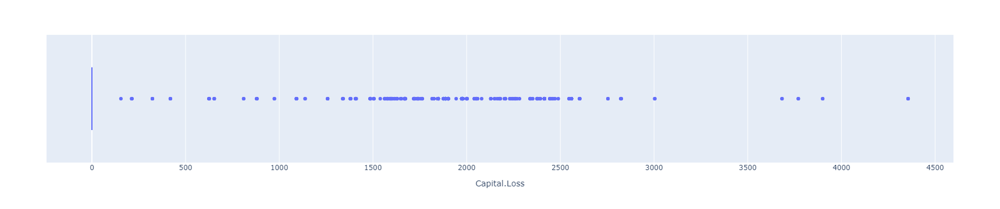

In [173]:
px.box(df, 'Capital.Loss')

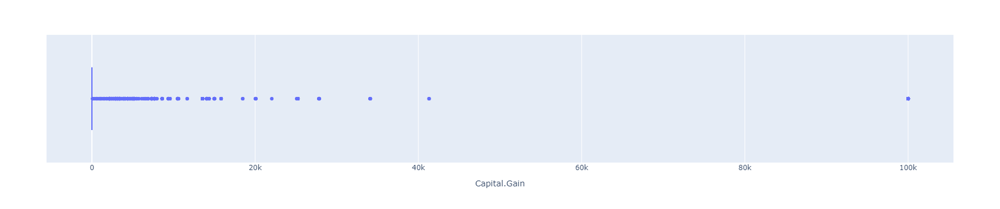

In [174]:
px.box(df, 'Capital.Gain')

### Capital Loss and Gain both have too many outliers so these are not contributing to any information.

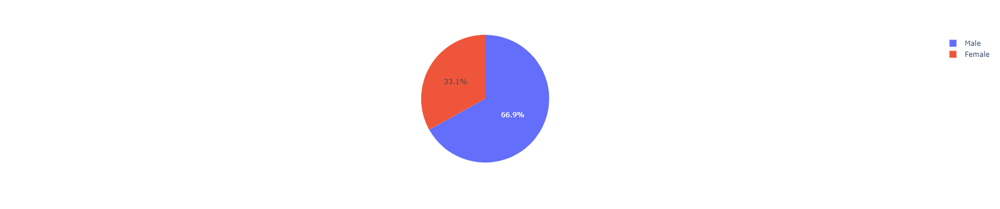

In [175]:
px.pie(df, 'Sex')

- ### In the given dataset, 2/3rd population is Male.


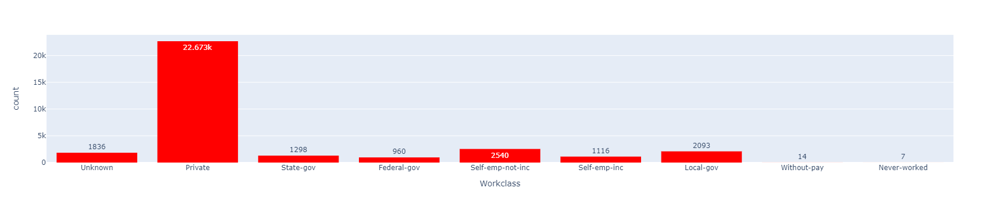

In [176]:
px.histogram(df, 'Workclass', text_auto=True).update_traces(marker=dict(color='red'))


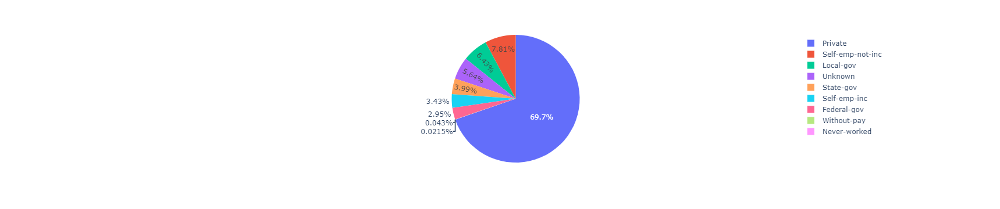

In [177]:
px.pie(df, 'Workclass')


- ### Nearly 70% of Workclass is Private.

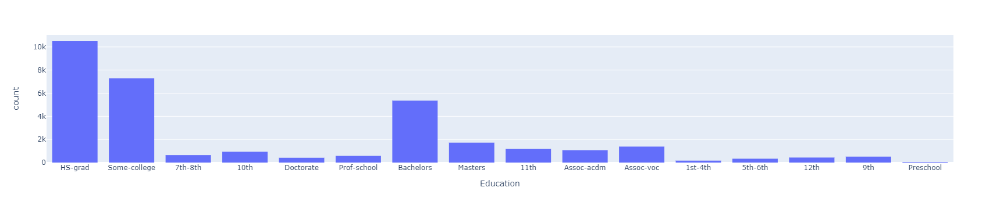

In [178]:
px.histogram(df, 'Education')

In [180]:
df.describe(include=['object']).T



,count,unique,top,freq
Age group,32537,5,21-40,16696
Workclass,32537,9,Private,22673
Education,32537,16,HS-grad,10494
Marital Status,32537,5,Married,15411
Occupation,32537,15,Prof-specialty,4136
Relationship,32537,6,Husband,13187
Race,32537,5,White,27795
Sex,32537,2,Male,21775
Native.Country,32537,42,United-States,29153
Income,32537,2,<=50K,24698


* ## Income is our dependent variable and nearly 76% people earn less than equal to 50k.
* ## Nearly 85.4% of people belong to white race.
* ## Nearly 70% of Workclass is Private.
* ## Around 32% people have only studied till Highschool Grad.
* ## Around 90% people are Native-American.

In [183]:
col_str = df.select_dtypes(['object'])
print(col_str.columns)

Index(['Age group', 'Workclass', 'Education', 'Marital Status', 'Occupation',
       'Relationship', 'Race', 'Sex', 'Native.Country', 'Income'],
      dtype='object')


In [184]:
for i in col_str.columns:
    print('Count of',i,'are:')
    print(col_str[i].value_counts())
    print('************************************************')

Count of Age group are:
21-40    16696
41-60    11105
0-20      2405
61-80     2233
80+         98
Name: Age group, dtype: int64
************************************************
Count of Workclass are:
Private             22673
Self-emp-not-inc     2540
Local-gov            2093
Unknown              1836
State-gov            1298
Self-emp-inc         1116
Federal-gov           960
Without-pay            14
Never-worked            7
Name: Workclass, dtype: int64
************************************************
Count of Education are:
HS-grad         10494
Some-college     7282
Bachelors        5353
Masters          1722
Assoc-voc        1382
11th             1175
Assoc-acdm       1067
10th              933
7th-8th           645
Prof-school       576
9th               514
12th              433
Doctorate         413
5th-6th           332
1st-4th           166
Preschool          50
Name: Education, dtype: int64
************************************************
Count of Marital Status are:
M

In [185]:
df.columns

Index(['Age', 'Age group', 'Workclass', 'Education', 'Marital Status',
       'Occupation', 'Relationship', 'Race', 'Sex', 'Capital.Gain',
       'Capital.Loss', 'Hours.Per.Week', 'Native.Country', 'Income'],
      dtype='object')

# Analyzing relation between the different variables.

## Relationship between Age group and Income:

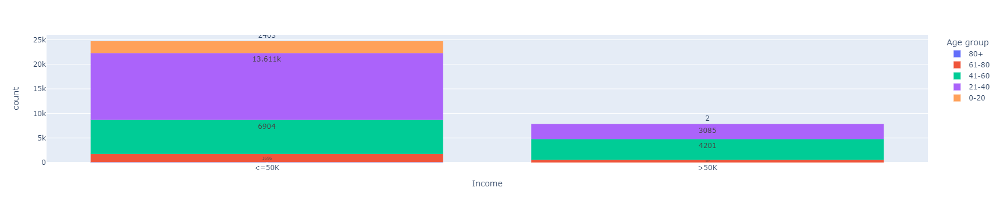

In [194]:
px.histogram(df, x = 'Income', color='Age group', text_auto=True)

- ### Nearly 76% people aged more than 60 yrs earns less than 50k.

- ### We are not seeling any significant impact of Age on Income so we need to further analyze it.

## Relationship between Marital Status and Income:

px.histogram(df, x="Income", color="Marital Status", text_auto=True)

- ### Among all the people, married people contributes nearly 86% in the 'more than 50k' group. So Marital Status can be an important factor in deciding income range.

## Relationship between Gender and Income:

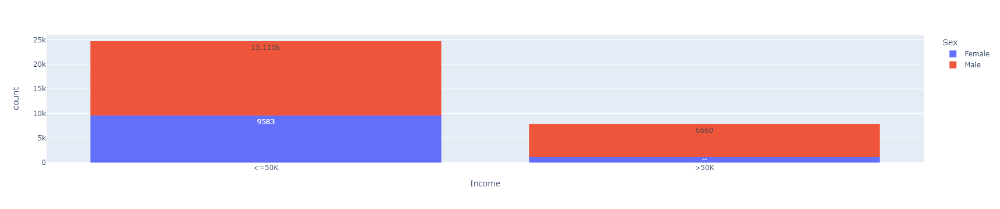

In [195]:
px.histogram(df, x="Income", color="Sex", text_auto=True)

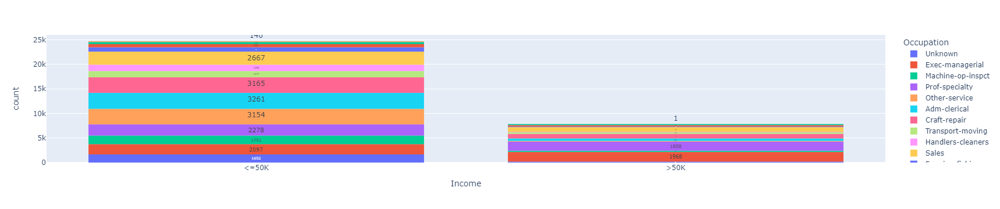

In [196]:
px.histogram(df, x="Income", color="Occupation", text_auto=True)

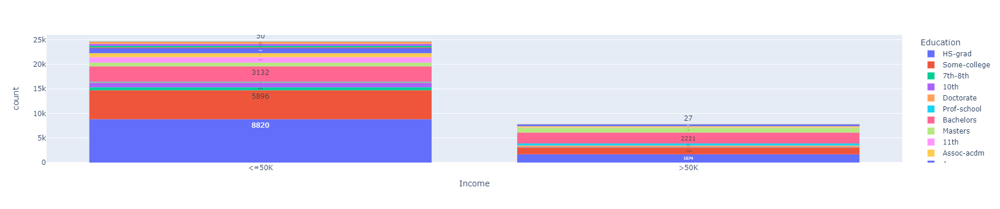

In [197]:
px.histogram(df, x="Income", color="Education", text_auto=True)

## Relation between Income and Workclass.

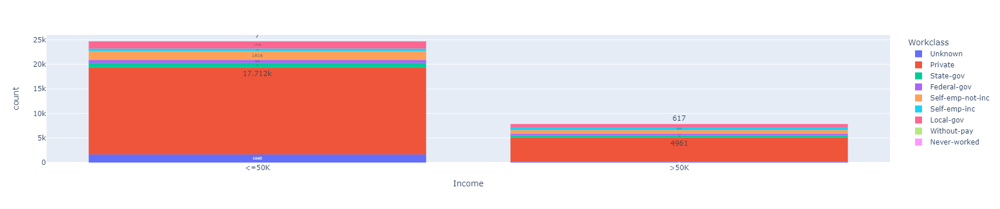

In [198]:
px.histogram(df, x="Income", color="Workclass", text_auto=True)

- ### Self-emp-inc shows different behaviour than other categories as in this category, more people earn more than 50k.